# Generative Models

1. Trained VAE model as *VAE_model.pth*
2. Trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

## Setting up working environment
Install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils

In [2]:
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [3]:
WORKING_ENV = 'COLAB' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'afs219' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/dl_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = '~/Documents/dl_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

Mounted at /content/drive/


## Introduction

1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part I use the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

The emphasis of both parts lies in understanding how the models behave and learn.

# Part 1 - Variational Autoencoder

a. Implement the VAE architecture with accompanying hyperparameters using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters 
num_epochs = 10
learning_rate = 1e-3
batch_size = 64 
latent_dim = 16 # Choose a value for the size of the latent space

# Additional Hyperparameters 


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [ ]:
# *CODE FOR PART 1.1a IN THIS CELL*

class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)


class UnFlatten(nn.Module):
    def forward(self, input, size=64):
        return input.view(input.size(0), size, 1, 1)

class VAE(nn.Module):
    def __init__(self, input_shape, image_channels=1, h_dim=64, latent_dim=32, alpha=1, lr=1e-3):
        super(VAE, self).__init__()

        self.latent_dim = latent_dim
        self.input_shape = input_shape
        

        self.encoder = nn.Sequential(
                    nn.Conv2d(image_channels, 32, kernel_size=4, stride=1, padding=2),
                    nn.ReLU(),
                    nn.Conv2d(32, 64, kernel_size=4, stride=2),
                    nn.ReLU(),
                    nn.Conv2d(64, 128, kernel_size=4, stride=2),
                    nn.ReLU(),
                    nn.Conv2d(128, 256, kernel_size=4, stride=2),
                    nn.ReLU())
        
        self.conv_out_size = self._get_conv_out_size(input_shape)
        self.hidden2mu = nn.Linear(self.conv_out_size, latent_dim)
        self.hidden2logvar = nn.Linear(self.conv_out_size, latent_dim)


        self.decoder_linear = nn.Sequential(
        nn.Linear(latent_dim, self.conv_out_size),
        nn.LeakyReLU(),
        nn.Dropout(0.2)
        )

        self.decoder = nn.Sequential(
                                    nn.ConvTranspose2d(256, 56, kernel_size=6, stride=2),
                                    nn.ReLU(),
                                    nn.ConvTranspose2d(56, 28, kernel_size=8, stride=3),
                                    nn.ReLU(),
                                    nn.ConvTranspose2d(28, image_channels, kernel_size=8, stride=1, padding=1),
                                    nn.Sigmoid())
        
    def _get_conv_out_size(self, shape):
        out = self.encoder(torch.zeros(1, *shape))
        self.conv_out_shape = out.size()
        return (np.prod(self.conv_out_shape))
            
        
    def encode(self, x):
        count = 1
        for layer in self.encoder:
            x = layer(x)
            count += 1
        hidden = x
        hidden = hidden.view(hidden.size(0), -1)
        mu = self.hidden2mu(hidden)
        log_var = self.hidden2logvar(hidden)
        return mu, log_var
    
    def reparametrize(self, mu, log_var):
        """
        :param mu: mean from the encoder's latent space
        :param logvar: log variance from the encoder's latent space
        """
        sigma = torch.exp(0.5*log_var) # standard deviation
        z = torch.randn(size = (mu.size(0),mu.size(1)))
        z = z.type_as(mu) # Setting z to be .cuda when using GPU training 
        sample = mu + sigma*z # sampling as if coming from the input space
        return sample

    def decode(self, z):
        i = 1
        z = self.decoder_linear(z)
        z = z.view(z.size()[0], *self.conv_out_shape[1:])
        for layer in self.decoder:
            z = layer(z)
            i += 1
        return z
    
    def forward(self, x):
        mu, log_var = self.encode(x)
        hidden = self.reparametrize(mu, log_var)
        output = self.decode(hidden)
        return mu, log_var, output

    def prior(self, a):
        return torch.randn(a.size(0), self.latent_dim).to(device)

model = VAE(input_shape=[1, 28, 28], latent_dim=latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch):   
            data = data.to(device)
            mu, log_var, recon_x = model.forward(data)
            break

NameError: name 'nn' is not defined


--- 

## Part 1.1b: Training the Model

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
import pickle 
# *CODE FOR PART 1.1b IN THIS CELL*
def loss_function_VAE(recon_x, x, mu, log_var, beta):
    kl_loss = -0.5 * torch.sum(1+log_var - mu**2 - torch.exp(log_var))
    recon_loss = F.binary_cross_entropy(recon_x, x, reduction="sum")
    loss = recon_loss + beta * kl_loss
    return loss, recon_loss, kl_loss

betas = [0.1, 1, 2, 10, 50]
num_epochs = 10
model.train()
losses = []
kl_losses = []
recon_losses = []
losses_test = []
kl_losses_test = []
recon_losses_test = []
epochs = []
for beta in betas:
    for epoch in range(num_epochs):  
        # <- You may wish to add logging info here
        loss_avg = 0
        kl_loss_avg = 0
        recon_loss_avg = 0
        loss_test_avg = 0
        kl_loss_test_avg = 0
        recon_loss_test_avg = 0
        test_iterator = iter(loader_test)
        with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
            for batch_idx, (data, _) in enumerate(tepoch):   

                try:
                    data_test, _ = next(test_iterator)
                except StopIteration:
                    test_iterator = iter(loader_test)
                    data_test, _ = next(test_iterator)

                model.train()
                data = data.to(device)
                mu, log_var, recon_x = model.forward(data)
                
                # Need at least one batch/random data with right shape -
                # This is required to initialize to model properly below
                # when we save the computational graph for testing (jit.save)
                loss, recon_loss, kl_loss = loss_function_VAE(recon_x, data, mu, log_var, beta)

                loss_avg += loss.item()/len(data)
                kl_loss_avg += kl_loss.item()/len(data)
                recon_loss_avg += recon_loss.item()/len(data)
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                model.eval()
                data_test = data_test.to(device) 
                mu, log_var, recon_x = model.forward(data_test)
                
                loss_test, recon_loss_test, kl_loss_test = loss_function_VAE(recon_x, data_test, mu, log_var, beta)
                
                loss_test_avg += loss_test.item()/len(data)
                kl_loss_test_avg += kl_loss_test.item()/len(data)
                recon_loss_test_avg += recon_loss_test.item()/len(data)
                

                epochs.append(epoch)

                if batch_idx % 20 == 0:
                    tepoch.set_description(f"Epoch {epoch}")
                    tepoch.set_postfix(loss=loss.item()/len(data))

        losses.append(loss_avg/len(loader_train))
        kl_losses.append(kl_loss_avg/len(loader_train))
        recon_losses.append(recon_loss_avg/len(loader_train))

        losses_test.append(loss_test_avg/len(loader_train))
        kl_losses_test.append(kl_loss_test_avg/len(loader_train))
        recon_losses_test.append(recon_loss_test_avg/len(loader_train))

        # save the model

        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    f'{content_path}/CW_VAE/VAE_model_{beta}.pth')
                
            with open(content_path/f'CW_VAE/losses_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(losses, f)
            
            with open(content_path/f'CW_VAE/recon_losses_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(recon_losses, f)

            with open(content_path/f'CW_VAE/kl_losses_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(kl_losses, f)

            with open(content_path/f'CW_VAE/losses_test_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(losses_test, f)
            
            with open(content_path/f'CW_VAE/recon_losses_test_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(recon_losses_test, f)

            with open(content_path/f'CW_VAE/kl_losses_test_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(kl_losses_test, f)

            with open(content_path/f'CW_VAE/epochs_mse_beta{beta}.pkl', 'wb') as f:
                pickle.dump(epochs, f)

Epoch 9: 100%|██████████| 938/938 [00:45<00:00, 20.42batch/s, loss=216]


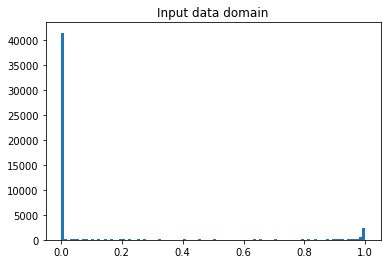

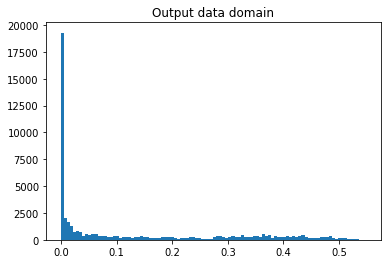

In [ ]:
samples, _ = next(iter(loader_test))

plt.title("Input data domain")
plt.hist(samples.flatten().numpy(), bins=100)
plt.savefig("data_domain.png")
plt.show()


samples = samples.to(device)
_, _, decoded = model(samples)
plt.title("Output data domain")
plt.hist(decoded.flatten().detach().cpu().numpy(), bins=100)
plt.savefig(content_path/f"data_domain.png")
plt.show()

### Loss Explanation

* The VAE Prior
* The output data domain
* Disentanglement in the latent space

It is clear that is required an encoder capable of producing a well-organised latent space. If the encodings are not regular, the decoder will not have learned how to represent those regions of the latent space that correlate to the encoded data inputs, and the output will be useless when attempting to create new representations from random noise.
As a result, when building the VAE and hence picking the loss function, there are obvious objectives such as having a disentangled and regularised latent space and reconstruction fidelity.

In order to find the optimum encoder-decoder setup, we train our network to minimise the BCE loss between the reconstructed images and the inputs. Because we are working with black and white images, our data input (and thus our data output) is essentially binary, we can think of our task as estimating the probability of each pixel output being black or white. The values in the input data domain and the output data domain can be observed in the above images.


The reconstruction error and regularisation are two terms in the loss function:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

Moreover, considering that all of the values are between 0 and 1, we employ a sigmoid activation function for the last layer of our decoder.

We employed KL divergence between the encoder distribution and the VAE prior for regularisation:
$$D_{K L}[q_\phi(z \mid X) \| p_\theta(z)] = \sum_{z \in Z}q(z|x)\log\frac{q(z|x)}{p_\theta(z)}$$

Indeed by encouraging the posterior to match the unit Gaussian prior, the beta-weighted KL helps the VAE to offset this effect. As a result, as the variance of the latent space reduces the KL divergence increases. Including this element in the loss function makes the latent space more complete and continuous. However, this comes at the cost of a larger training data reconstruction error. As a result, a tradeoff between the reconstruction error and the KL divergence is required, and we must select a suitable beta value.


Disentanglement happens when each latent variable contains separate information. Latent representations become more meaningful as a result of this. We accomplish this with beta-VAE because the posterior covariance is strongly factorised, implying that the latent dimensions are uncorrelated.



<h2>Part 1.2</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves
Loss curves' plots (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). Multiple plots are displayed for different values of $\beta$ .

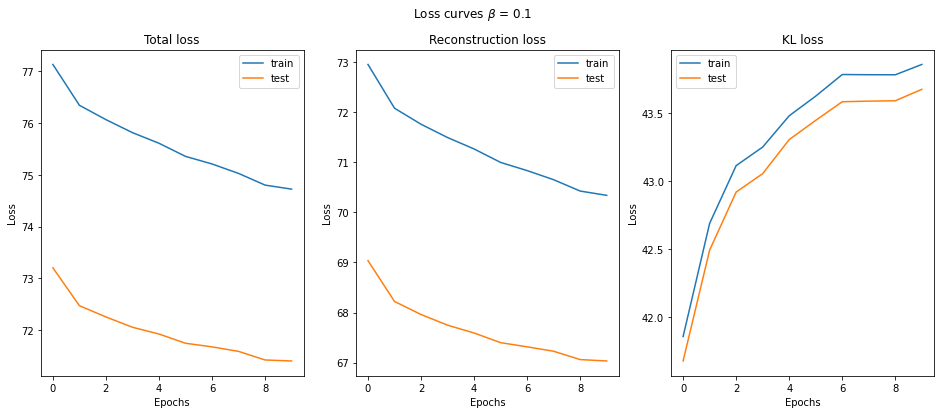

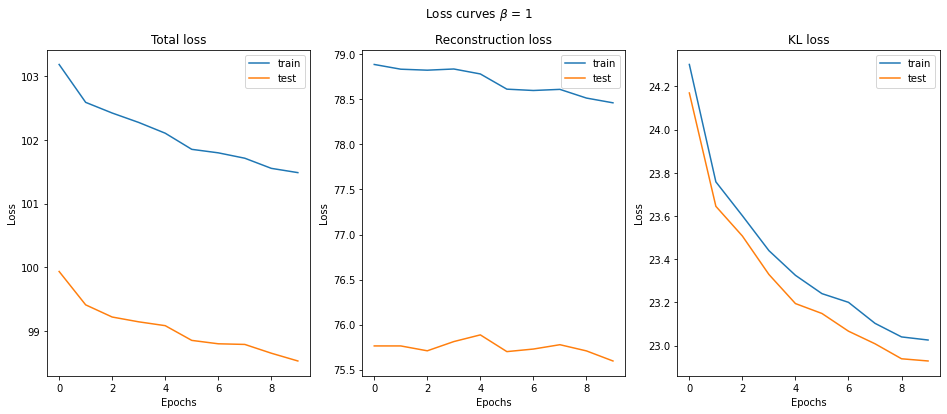

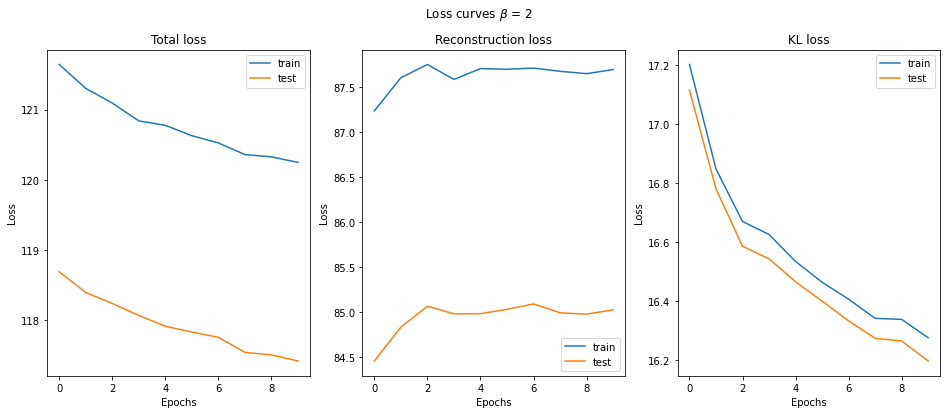

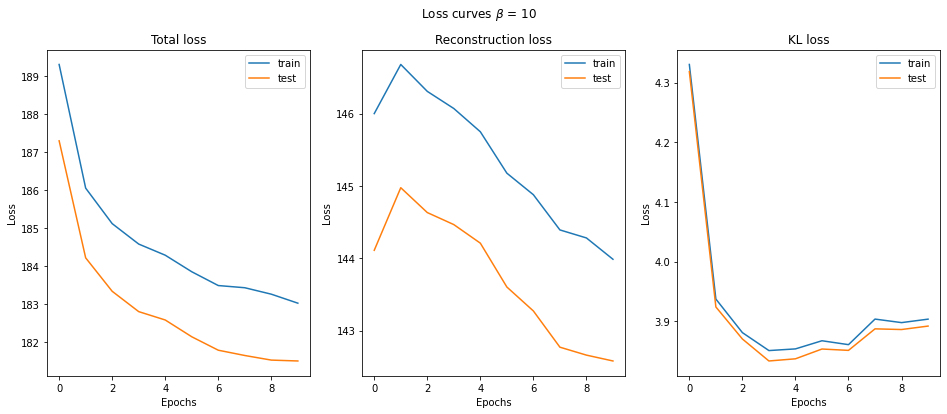

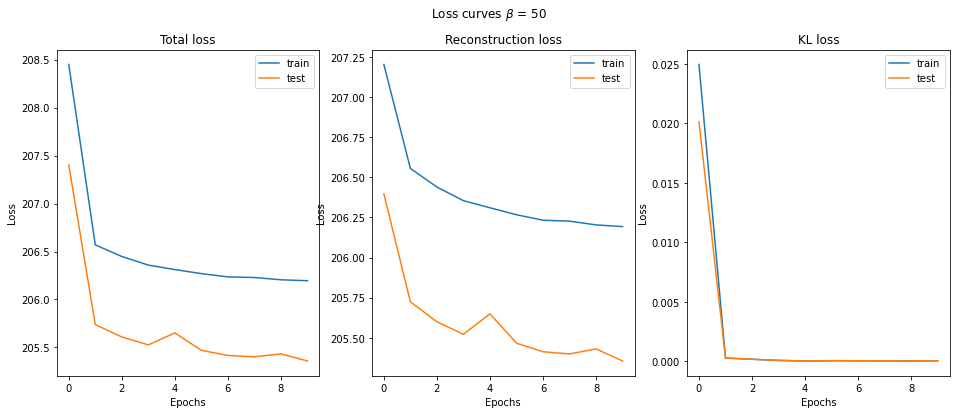

In [ ]:
# *CODE FOR PART 1.2a IN THIS CELL*

x = 0
for beta in betas:
    with open(content_path/f'CW_VAE/losses_mse_beta{beta}.pkl', 'rb') as f:
        losses = pickle.load(f)
    
    with open(content_path/f'CW_VAE/recon_losses_mse_beta{beta}.pkl', 'rb') as f:
        recon_losses = pickle.load(f)

    with open(content_path/f'CW_VAE/kl_losses_mse_beta{beta}.pkl', 'rb') as f:
        kl_losses = pickle.load(f)

    with open(content_path/f'CW_VAE/losses_test_mse_beta{beta}.pkl', 'rb') as f:
        losses_test = pickle.load(f)
    
    with open(content_path/f'CW_VAE/recon_losses_test_mse_beta{beta}.pkl', 'rb') as f:
        recon_losses_test = pickle.load(f)

    with open(content_path/f'CW_VAE/kl_losses_test_mse_beta{beta}.pkl', 'rb') as f:
        kl_losses_test = pickle.load(f)

    with open(content_path/f'CW_VAE/epochs_mse_beta{beta}.pkl', 'rb') as f:
        epochs = pickle.load(f)

    fig, axs = plt.subplots(1, 3, figsize=(16,6))
    fig.suptitle(rf'Loss curves $\beta$ = {beta}')
    
    axs[0].plot(losses[x:x+10], label = "train")
    axs[0].plot(losses_test[x:x+10], label = "test")
    axs[0].set_title("Total loss")
    axs[0].set_ylabel('Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].legend()

    axs[1].plot(recon_losses[x:x+10], label = "train")
    axs[1].plot(recon_losses_test[x:x+10], label = "test")
    axs[1].set_title("Reconstruction loss")
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epochs')
    axs[1].legend()

    axs[2].plot(kl_losses[x:x+10], label = "train")
    axs[2].plot(kl_losses_test[x:x+10], label = "test")
    axs[2].set_title("KL loss")
    axs[2].set_ylabel('Loss')
    axs[2].set_xlabel('Epochs')
    axs[2].legend()

    x += 10
    
    plt.savefig(content_path/f'CW_VAE/loss_curves_beta{beta}.png', bbox_inches='tight', dpi=150)
    plt.show()

## Part 1.2b: Samples and Reconstructions
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples.

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


In [ ]:
beta = 2
weights = torch.jit.load(f'{content_path}/CW_VAE/VAE_model_{beta}.pth').state_dict()
model.load_state_dict(weights)

<All keys matched successfully>

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


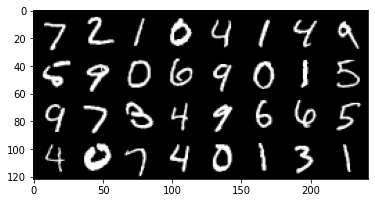

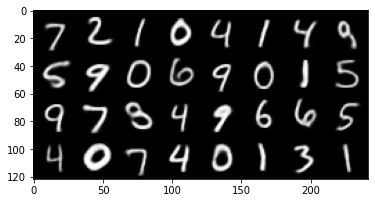

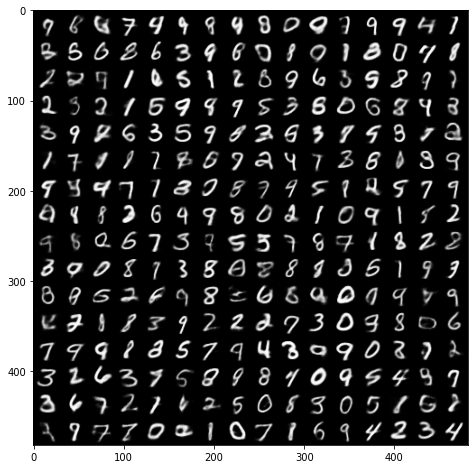

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
model.eval()

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    fixed_input = fixed_input.to(device)
    _, _, recon_batch = model.forward(fixed_input) 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    samples = model.decode(z) 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion

Brief analysis of the loss curves and reconstructions: 
* Behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)
* Posterior collapse (i.e. when the KL is too small during the early stages of training)
    * Methods to mitigate it. Reflection on the output samples.

As the VAE is trained, I notice an increasing KL loss and a decreasing reconstruction loss.

When we start training the VAE, we can see that both q and p are not yielding good latent variables and image representations. They begin to behave independently, and q learns to output items similar to the prior. p is most likely learning how to make images that resemble the data's mean, resulting in a significant loss when comparing the input data to the produced output.

The encoder and decoder will learn how to insert input information into the posterior $q(z|x)$ as the network is trained, causing the latent representations to diverge more from the prior. The VAE will also learn how to recreate the correct samples using the enhanced posterior's improved latent representations. As a result, better reconstructions will result in less reconstruction losses.

When the learnt latent space is near to the prior, posterior collapse. The fundamental issue is that the VAE is unable to generate proper samples since the decoder is unable to utilise all of the latent dimensions' information. In other words, the decoder learns to disregard a subset of the latent variables when the KL term is minimised and the variational distribution is encouraged to match the prior.

I've seen the posterior collapse at the start of the VAE's training and also when the $beta$ was too high. The KL loss was lowest at $beta$ = 50, and the resulting outputs are noisy and generic, not representative of the original data.


---
<h2> Part 1.3 <h2/>

Qualitative analysis of the learned representations

Representations learned by the model. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html).

In [ ]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE
beta = 0.1
model = VAE(input_shape=[1, 28, 28], latent_dim=latent_dim).to(device)
weights = torch.jit.load(f'{content_path}/CW_VAE/VAE_model_{beta}.pth').state_dict()
model.load_state_dict(weights)
z = None
labels = None

with tqdm.tqdm(loader_test, unit="batch") as tepoch: 
    for batch_idx, (data_test, l) in enumerate(tepoch):

        # Need at least one batch/random data with right shape -
        # This is required to initialize to model properly below
        # when we save the computational graph for testing (jit.save)

        model.eval()
        data_test = data_test.to(device) 
        mu, logvar = model.encode(data_test)
        recon_data = model.reparametrize(mu, logvar)
    

        if z is None or labels is None:
            z = recon_data
            labels = l

        else:
            z = torch.cat((z, recon_data), dim=0)
            labels = torch.cat((labels, l), dim=0)

        if batch_idx % 20 == 0:
            tepoch.set_description(f"Epoch")

z = z.cpu().detach().numpy()
labels = labels.cpu().detach().numpy()
perplexity = 30
z_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=perplexity).fit_transform(z, labels)

Epoch: 100%|██████████| 157/157 [00:03<00:00, 49.89batch/s]


In [ ]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)

alt.HConcatChart(...)

In [ ]:
# Custom Visualizations
# Load models

from sklearn.manifold import TSNE
import pandas as pd
import seaborn as sns

betas = [0.1, 1, 2, 10, 50]
models = {}

for beta in betas:
    models[beta] = VAE(input_shape = [1, 28, 28], latent_dim=latent_dim)
    weights = torch.jit.load(f'{content_path}/CW_VAE/VAE_model_{beta}.pth').state_dict()
    model.load_state_dict(weights)

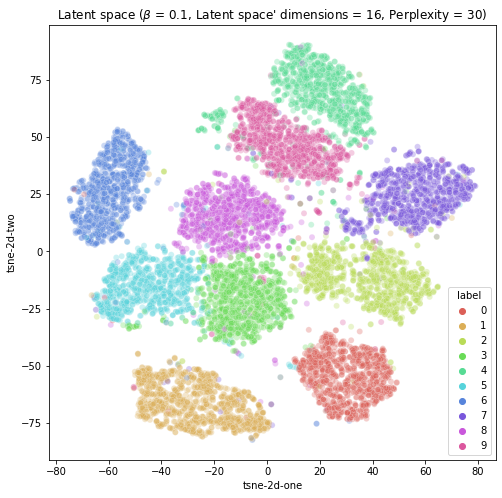

In [ ]:
# Custom Visualizations
beta = 0.1
model = models[beta]

df = pd.DataFrame(data=z_embedded, columns=["tsne-2d-one", "tsne-2d-two"])
df["label"] = labels

plt.figure(figsize=(8,8))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="label",
    palette=sns.color_palette("hls", 10),
    data=df,
    legend="full",
    alpha=0.3
)
plt.title(rf"Latent space ($\beta$ = {0.1}, Latent space' dimensions = {latent_dim}, Perplexity = {perplexity})")
plt.savefig(content_path/f'CW_VAE/latent_space_bce_beta{beta}_latentdim{latent_dim}.png')

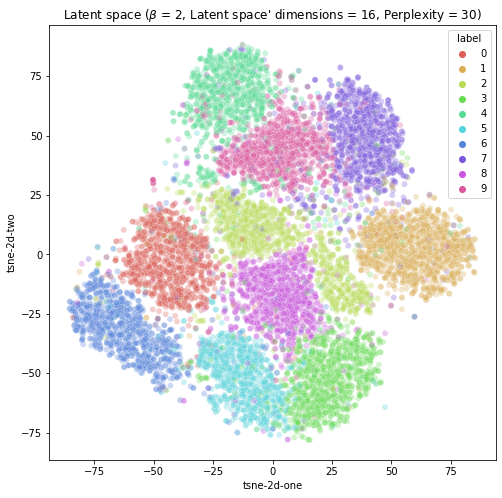

In [ ]:
# Custom Visualizations
beta = 2
model = models[beta]

df = pd.DataFrame(data=z_embedded, columns=["tsne-2d-one", "tsne-2d-two"])
df["label"] = labels

plt.figure(figsize=(8,8))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="label",
    palette=sns.color_palette("hls", 10),
    data=df,
    legend="full",
    alpha=0.3
)
plt.title(rf"Latent space ($\beta$ = {2}, Latent space' dimensions = {latent_dim}, Perplexity = {perplexity})")
plt.savefig(content_path/f'CW_VAE/latent_space_bce_beta{beta}_latentdim{latent_dim}.png')

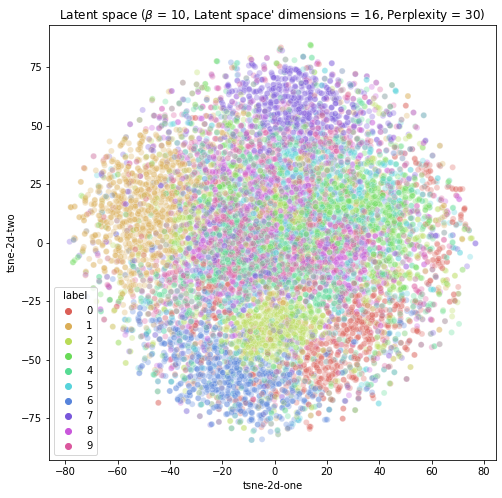

In [ ]:
# Custom Visualizations

df = pd.DataFrame(data=z_embedded, columns=["tsne-2d-one", "tsne-2d-two"])
df["label"] = labels

plt.figure(figsize=(8,8))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="label",
    palette=sns.color_palette("hls", 10),
    data=df,
    legend="full",
    alpha=0.3
)
plt.title(rf"Latent space ($\beta$ = {10}, Latent space' dimensions = {latent_dim}, Perplexity = {perplexity})")
plt.savefig(content_path/f'CW_VAE/latent_space_bce_beta_{beta}_latentdim{latent_dim}.png')

### Discussion
Discuss the structure of the visualized representations. 
* Role of the KL loss term and $\beta$ have
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Consequences of changing parameters of T-SNE reliable. [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

It is of utmost importance to remind the essential concepts of the Variational Autoencoder when constructing it; in particular, I would like to emphasise that VAEs solve a dimensionality reduction problem in order to create the latent space. Given that reducing the input data to just a few dimensions can result in a latent space that cannot maintain all the information in the data inputs, the decoder will be unable to recreate the VAE's inputs appropriately. Furthermore, because of its lack of regularity, a low-dimensional latent space is unintelligible and cannot be used to generate content.

The reverse transformation performed by the decoder suffers a noticeable loss in a low-dimensional region. Furthermore, because the latent space has so few dimensions, the multiple data types become entangled in it, the decoder will send noisy information about the data inputs $x$.

Additionally, a higher $beta$ will cause the VAE to concentrate more on minimising the KL divergence between the prior and posterior, resulting in a more regularised latent space with greater continuity and completeness. However, if $beta$ is too high and KL is too low, the posterior distributions will overlap, resulting in a greater log likelihood loss and a VAE with less digit discriminability. 

Between the hyperparameters used to build the t-SNE diagram it is relevant to mention perplexity: therefore changing this parameter which specifies the relationship between the local and global elements of the data you want to represent.

Although t-SNE can produce useful low-dimensional representations of your data, characteristics like cluster size and distance between each others may be unrepresentative.

T-SNE algorithm uses local density changes in the data set to calculate distance. As a result, it extends dense clusters while contracting sparse ones, bringing the cluster sizes closer together. T-SNE allows us to evaluate if data from high dimensions is uniformly distributed or not by examining whether or not the cluster is equally dispersed. 

It's worth noting that the latent space is structured in the same way regardless of confusion in terms of whether digits' latent representations collide.

## Part 1.3b: Interpolating in $z$
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. 
Transition from one digit to another


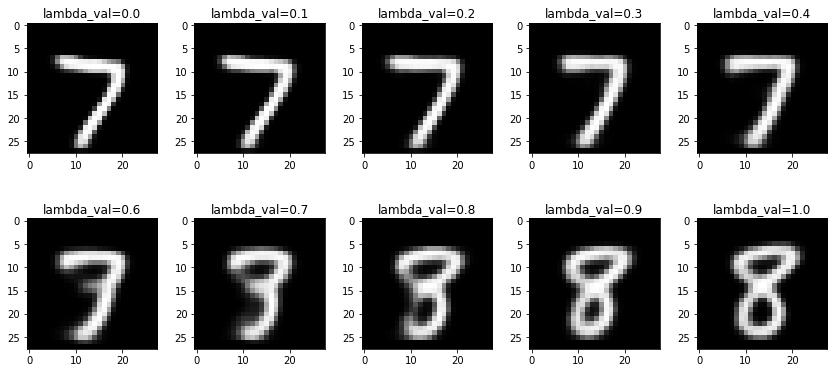

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL
fig, axs = plt.subplots(2,5, figsize=(15, 6))
fig.subplots_adjust(hspace = .5, wspace=.001)
axs = axs.ravel()

latent_representations = []
classes = []
first_digit = -1
with torch.no_grad():
  for t, (x, y) in enumerate(loader_test):
    if y[0] != first_digit:
      first_digit = y[0]
      x = x.to(device)
      model.eval()
      with torch.no_grad():
        mu, logvar = model.encode(x)
        z = model.reparametrize(mu, logvar)
        latent_representations.append(z.detach().cpu().numpy()[0])
        classes.append(y[0].detach().numpy())
      if len(latent_representations) > 1:
        break

latent_representations = np.array(latent_representations)
classes = np.array(classes)
ratios = np.linspace(0, 1, 10)
new_points = []
for ratio in ratios:
  v = (1.0 - ratio) * latent_representations[0] + ratio * latent_representations[1]
  new_points.append(v)

with torch.no_grad():
  model.train()
  new_points = np.array(new_points)
  z = torch.tensor(new_points).view(-1,latent_dim).to(device)
  recon = model.decode(z)
  recon = recon.cpu()

for idx, ratio in enumerate(ratios):
  image = recon[idx].clamp(0,1).numpy()

  axs[idx].imshow(image[0,:,:], cmap='gray')
  axs[idx].set_title('lambda_val='+str(round(ratio,1)))
plt.show()

### Discussion

The latent representations that lie in the latent space between two other numbers' latent representations, when interpolated, create similar images to the two orignal digits. Besides if other numbers' representations also lie between the two initial digits' representations, when interpolating the decoder will create images also similar to those numbers.
As a result, if T-SNE is correctly formed, the generated numbers should correspond to those digits whose latent space representation is between the two original digits' representations.

# Part 2 - Deep Convolutional GAN

Train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. Experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end it is shown: 

- best trained model, 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$, 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explaination whether the produced plots are theoretically sensible and why this is (or not) the case. 
- discussion on whether is noticeable any mode collapse, where this behaviour may be attributed to, and explanations of how I cope with mode collapse. 

## Part 2.1 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from the best model's generator

d. Discussion of the experimentations which led to the final architecture.

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)



Using cuda


### Part 2.1a: Implement DCGAN

Below are defined:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`


#### Data loading

In [ ]:
batch_size = 16

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


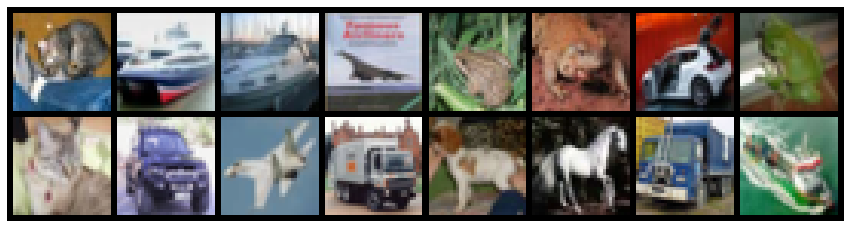

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [5]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 20
learning_rate_g = 0.0004
learning_rate_d = 0.0001
latent_vector_size = 100
# Number of channels in the training images. For color images this is 3
nc = 3
# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64


In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(#nn.Upsample(scale_factor = 2),
            # input is Z, going into a convolution
            nn.ConvTranspose2d(latent_vector_size, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d( ngf*2, nc, 3, 1, 1, bias=False),
            nn.Tanh()
        )

        self.output_scale = nn.Parameter(torch.tensor([2.8]), requires_grad=True)

    # You can modify the arguments of this function if needed
    def forward(self, z):
        count = 1
        for layer in self.main:
            z = layer(z)
            count += 1
        z = z.mul(self.output_scale)
        return z


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            nn.Conv2d(nc, ndf, 3, 1, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
           
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
           
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
    # You can modify the arguments of this function if needed
    def forward(self, x):
        i = 1
        for layer in self.main:
            x = layer(x)
            i += 1
        
        return x




<h2> Initialize Model and print number of parameters </h2>

`weights_init` is used to initialize the weights of the Generator and Discriminator networks.

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 12655745
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 3, kernel_size=(3, 3), stride=

### Part 2.1b: Training the Model

#### Defining a Loss

In [ ]:
# You can modify the arguments of this function if needed
def loss_function(out, label):
    loss = F.binary_cross_entropy(out, label, reduction='mean')
    return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate_g, betas=(beta1, 0.999))


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here

# Establish convention for real and fake labels during training
real_label = 0.95
fake_label = 0.

#### Training Loop

* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [ ]:
train_losses_G = []
train_losses_D = []
epochs = []

# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    train_loss_D = 0
    train_loss_G = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            
            # train with real
            model_D.train()
            optimizerD.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Forward pass real batch through D
            output = model_D(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = loss_function(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()
            # train with fake
            # Generate batch of latent vectors
            noise = torch.randn(b_size, latent_vector_size, 1, 1, device=device)
            # Generate fake image batch with G
            fake = model_G(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = model_D(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = loss_function(output, label)
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            errD_fake.backward()
            # Update D
            optimizerD.step()
        
            D_G_z1 = output.mean().item()
            # Compute error of D as sum over the fake and the real batches
            errD = errD_real + errD_fake
            
            # (2) Update G network: maximize log(D(G(z)))
            model_G.train()
            optimizerG.zero_grad()

            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = model_D(fake).view(-1)
            # Calculate G's loss based on this output
            errG = loss_function(output, label)
            # Calculate gradients for G
            errG.backward()
    
            # Update G
            optimizerG.step()

            D_G_z2 = output.mean().item()

            # Save the losses for plotting
            train_loss_G += errG.item()
            train_loss_D += errD.item()

            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())

    epochs.append(epoch)
    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples_tanh_lr.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), str(content_path/'CW_GAN/fake_samples_epoch_tanh_lr_%03d.png') % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

Epoch 19: 100%|██████████| 3125/3125 [02:28<00:00, 20.99batch/s, D_G_z=0.006/0.014, D_x=0.802, Loss_D=0.331, Loss_G=4.92]


In [ ]:
model_G = torch.jit.load(content_path/'./CW_GAN/GAN_G_model.pth')

model_D = torch.jit.load(content_path/'./CW_GAN/GAN_D_model.pth')

## Part 2.1c: Results


<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


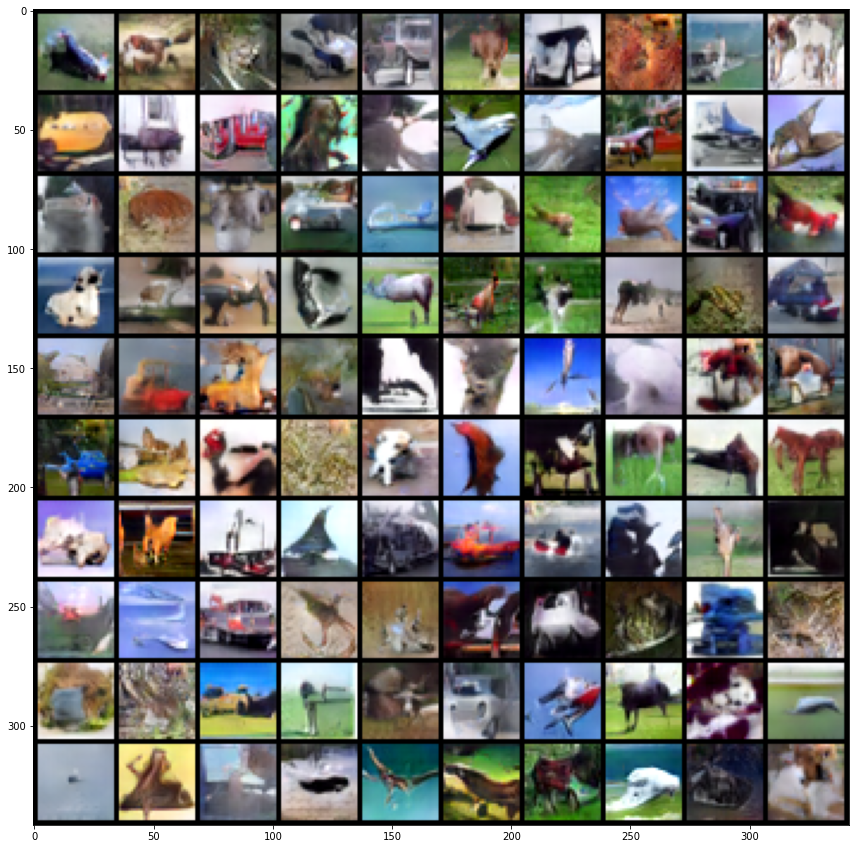

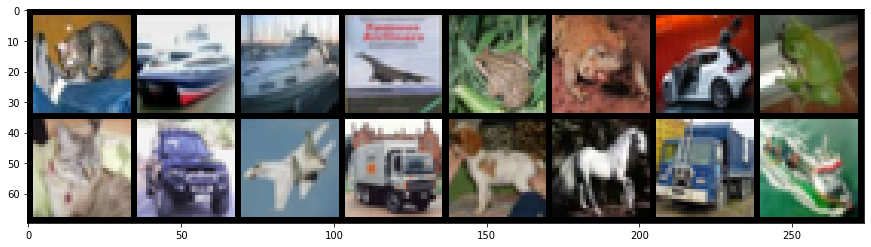

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final_2.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices

* Empirically useful methods utilised
* What didn't work, what worked and what mattered most
* Tricks helpuful here

In order to implement DCGAN I initially referred to the architecture proposed in https://arxiv.org/pdf/1511.06434.pdf and https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. The first interesting consideration is that in these papers have been took into account 64-bits images. 

Therefore, for adapting the aforementioned architecture to the CIFAR10 dataset of 32x32 bit images I initially evaluated the possibility of upsampling. Nonetheless this first attempt did not produce good output as there was a clear convergence failure.
Thus I adjusted the architecture to work with 32x32 images avoiding upsampling. Furthermore, I decided to use tanh as activation function for the generator. It is interesting to notice that tanh clips the output domain between -1 and 1 and this was unsuitable when computing the loss since the input domain was different. Therefore, I scaled up the tanh output by a learnt parameter getting more realistic images.

Then for obtaining higher quality output I lowered the batch size from 128 to 16 because a larger batch size reduces performance, the generator may receive too many samples during initial training, and thus overfit.

The proposed learning rate of 0.0002 produced quite good result. Nevertheless, I obtained better results using to different learning rates for the generator and the discriminator. In particular, a higher learning rate for the generator assured more stability and equilibrium considering the different complexity of the two architectures.

Considering Label Smoothing, that is lowering the initial value of the real images' labels implying the discriminator to stop being overconfident about its classification.

Additionally, it is of utmost relevance to point out that considering the suggestion from the papers: 
- Batch normalisation was used for stabilising the learning by normalising the input to have zero mean and unit variance;
- ReLU activation functions was applied in the generator and Leaky ReLU in the discriminator.

There are few other tricks that has not been employed but I find worthy to mention, such as:
- Minibatch discrimination that consist of computing the related loss by descriminating whole minibatches;
- Feature Matching.

## Part 2.2: Understanding GAN Training


### Loss Curves

Losses curves for the discriminator $D$ and the generator $G$ as the training progresses (x-axis: epochs, y-axis: loss).

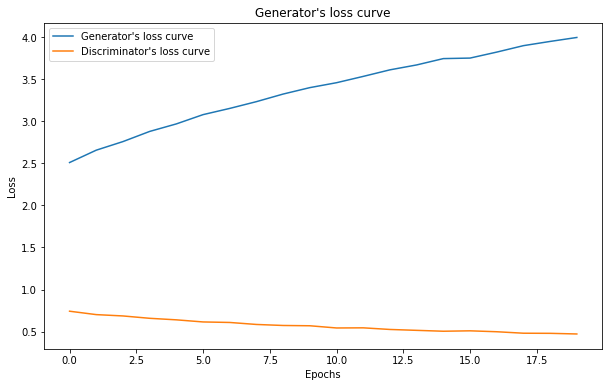

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*
plt.figure(figsize=(10,6))
plt.plot(epochs, train_losses_G, label="Generator's loss curve")
plt.plot(epochs, train_losses_D, label="Discriminator's loss curve")
plt.title("Generator's loss curve")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.savefig(content_path/f'CW_GAN/losses_2.png')

### Discussion

- Sensibility of loss curves


When optimising the minimax objective during GAN training, we are looking for a generator that can fool the discriminator, as well as a discriminator that can distinguish fake images from the real ones. As a consequence, the we are looking for an equilibrium in which neither model (the discriminator nor the generator) outperforms the other.
It can be observed that when the generator loss increase the disciminator one decrease since they are adversary.
Nonetheless, it is of paramount importance that both the loss curves reach a stability converging to an optimum after in order to appear reasonable.


### Discussion


## Part 2.3: Understanding Mode Collapse
 
- Causes of Mode Collapse phenomenon and manifestation in the samples from a GAN. Based on the images created by the generator using the `fixed_noise` vector during training, analyse mode collapse, possible reasons, and interventions.

GANs ideally can provide diversified output images; anyway, if the model encounters issues during training, it may only produce a single form of output. The main issue that the model confronts when it suffers Mode Collapse is that if the generator can trick the discriminator with the same sort of data (because to the discriminator's lack of training), the generator will not be incentivize to create additional output that can also fool the discriminator (the generator is learning to map multiple latent variables to the same output).

Mode Collapse can be determined by looking at the loss curves, in addition to looking at similar output images. If they oscillate, the GAN is most likely experiencing mode collapse.
If the discriminator becomes caught in a local minimum and fails to find the optimum strategy, the generator will look for another output that will trick the discriminator. The process will restart again, and the discriminator will never be able to learn its way out of the trap (oscillation of the loss curves).

Considering this model I succeed in contrasting Mode Collapse changing the learning rate. Other possible strategies could have been to change the loss function to Wassertein loss for avoiding the discriminator to get stuck in a local minima or using feature matching or minibatch discrimination.



# Test Cell



In [ ]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_2/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)